NIM GENAP = 2702224282

DATASET A_23

In [15]:
import zipfile
import os

In [16]:
zip_path = 'A_23.zip'           # ganti namanya sesuai dengan dataset yang udah kita upload
extract_path = '/content/dataset'  # tempat ekstraknya

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# Cek isi foldernya
print(os.listdir(extract_path))

['A_23']


mengekstrak file ZIP bernama A_23.zip ke folder /content/dataset, lalu menampilkan daftar isi folder tersebut setelah diekstrak.

In [17]:
image_folder = os.path.join(extract_path, 'A_23')

image_paths = [os.path.join(image_folder, fname)
               for fname in os.listdir(image_folder)
               if fname.lower().endswith(('.jpg', '.jpeg', '.png'))]

mengambil semua path gambar (.jpg, .jpeg, .png) dari folder A_23 (yang ada di dalam folder hasil ekstraksi), dan menyimpannya dalam list image_paths.

# A

In [18]:
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

## GAN MODEL

In [19]:
# Konfigurasi
IMG_WIDTH = 100
IMG_HEIGHT = 100
CHANNELS = 3
LATENT_DIM = 100
BATCH_SIZE = 32

# Persiapan Dataset
def load_and_preprocess_images(image_paths, target_size=(IMG_WIDTH, IMG_HEIGHT)):
    images = []
    for path in image_paths:
        img = Image.open(path)
        img = img.resize(target_size)
        img = np.array(img)

        # Normalisasi gambar ke range [-1, 1] untuk generator dengan aktivasi tanh
        img = (img - 127.5) / 127.5
        images.append(img)

    return np.array(images)

# Load dataset
dataset = load_and_preprocess_images(image_paths)
print(f"Shape dataset: {dataset.shape}")

Shape dataset: (1074, 100, 100, 3)


Dataset berisi 1.074 gambar berwarna dengan ukuran 100×100 piksel, yang telah dinormalisasi ke rentang [-1, 1] dan siap digunakan untuk training model GAN.

In [20]:
# Membuat generator
def build_generator():
    model = tf.keras.Sequential()

    # Input layer
    model.add(layers.Dense(25*25*64, input_dim=LATENT_DIM))
    model.add(layers.Reshape((25, 25, 64)))

    # Conv layer 1
    model.add(layers.Conv2DTranspose(64, (4, 4), strides=2, padding='same', activation='relu')) # Adjusted kernel and stride
    # Conv layer 2
    model.add(layers.Conv2DTranspose(32, (4, 4), strides=2, padding='same', activation='relu')) # Adjusted kernel and stride
    # Conv layer 3
    model.add(layers.Conv2DTranspose(16, (4, 4), strides=1, padding='same', activation='relu'))

    # Output layer
    model.add(layers.Conv2DTranspose(CHANNELS, (4, 4), strides=1, padding='same', activation='tanh')) # Adjusted kernel and stride


    return model

membuat generator dengan 3 layer convolution dengan masing masing jumlah kernel sebanyak 16, 32, 64, pake fungsi aktivasi relu juga kecuali layer terahkir, layer terahkir memakai aktivasi Tanh.

Lalu disini ada mengubah vektor noise berdimensi 100 menjadi gambar berwarna ukuran 100 × 100 piksel melalui beberapa tahap upsampling menggunakan Conv2DTranspose, dan menghasilkan output dengan aktivasi tanh dalam rentang [-1, 1].

In [21]:
# Membuat diskriminator
def build_discriminator():
    model = tf.keras.Sequential()

    # Conv layer 1
    model.add(layers.Conv2D(16, (5, 5), strides=2, padding='same', input_shape=(IMG_WIDTH, IMG_HEIGHT, CHANNELS)))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Conv layer 2
    model.add(layers.Conv2D(32, (5, 5), strides=2, padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Conv layer 3
    model.add(layers.Conv2D(64, (5, 5), strides=2, padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Flatten dan output
    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation='sigmoid'))

    return model

membuat diskriminator sama requirement nya seperti yang generator diatas tadi, ditambah Fully connected terdiri dari single layer dengan fungsi aktivasi Sigmoid.

In [22]:
# Membuat GAN
class GAN(tf.keras.Model):
    def __init__(self, generator, discriminator):
        super(GAN, self).__init__()
        self.generator = generator
        self.discriminator = discriminator

    def compile(self, g_optimizer, d_optimizer, loss_fn):
        super(GAN, self).compile()
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer
        self.loss_fn = loss_fn
        self.d_loss_metric = tf.keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = tf.keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # Generate random noise
        batch_size = tf.shape(real_images)[0]
        noise = tf.random.normal(shape=(batch_size, LATENT_DIM))

        # Train discriminator
        with tf.GradientTape() as d_tape:
            # Generate fake images
            generated_images = self.generator(noise)

            # Get discriminator predictions
            real_predictions = self.discriminator(real_images)
            fake_predictions = self.discriminator(generated_images)

            # Calculate losses
            real_loss = self.loss_fn(tf.ones_like(real_predictions), real_predictions)
            fake_loss = self.loss_fn(tf.zeros_like(fake_predictions), fake_predictions)
            d_loss = (real_loss + fake_loss) / 2

        # Calculate gradients and update weights
        d_gradients = d_tape.gradient(d_loss, self.discriminator.trainable_variables)
        self.d_optimizer.apply_gradients(zip(d_gradients, self.discriminator.trainable_variables))

        # Train generator
        with tf.GradientTape() as g_tape:
            # Generate fake images
            generated_images = self.generator(noise)

            # Get discriminator predictions
            fake_predictions = self.discriminator(generated_images)

            # Calculate loss
            g_loss = self.loss_fn(tf.ones_like(fake_predictions), fake_predictions)

        # Calculate gradients and update weights
        g_gradients = g_tape.gradient(g_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(zip(g_gradients, self.generator.trainable_variables))

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result()
        }

Kelas GAN ini menggabungkan generator dan diskriminator ke dalam satu model adversarial. Saat train_step dijalanin, model secara bergantian melatih diskriminator untuk membedakan gambar asli dan palsu, lalu melatih generator untuk menghasilkan gambar palsu yang mampu menipu diskriminator. Proses training menggunakan dua GradientTape dan mengoptimalkan masing-masing loss dengan Adam optimizer.

In [23]:
# Fungsi untuk menampilkan hasil generator
def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)

    fig = plt.figure(figsize=(4, 4))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow((predictions[i] + 1) / 2)  # Scale back to [0,1]
        plt.axis('off')

    plt.show()


Membuat Fungsi untuk menampilkan gambar hasil generator pada setiap epoch. Gambar yang dihasilkan dari vektor noise (test_input) dinormalisasi kembali dari rentang [-1, 1] ke [0, 1], lalu ditampilkan dalam grid 4×4 tanpa sumbu koordinat.

In [24]:
# Inisialisasi model
generator = build_generator()
discriminator = build_discriminator()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


menginisialisasi dua model utama dalam arsitektur GAN, yaitu generator untuk menghasilkan gambar palsu dari noise, dan discriminator untuk membedakan gambar asli dan palsu.

In [25]:
# Kompilasi model
gan = GAN(generator, discriminator)
gan.compile(
    g_optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    d_optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    loss_fn=tf.keras.losses.BinaryCrossentropy()
)


mengompilasi model GAN dengan menetapkan optimizer Adam untuk generator dan diskriminator, serta fungsi loss BinaryCrossentropy untuk mengukur seberapa baik keduanya dalam bersaing, generator dalam menipu, dan diskriminator dalam membedakan gambar asli dan palsu.

In [26]:
# Persiapan training
# Buat dataset
train_dataset = tf.data.Dataset.from_tensor_slices(dataset).shuffle(1000).batch(BATCH_SIZE)

# Seed untuk visualisasi
num_examples_to_generate = 16
seed = tf.random.normal([num_examples_to_generate, LATENT_DIM])

menyiapkan data untuk training dengan membagi dataset menjadi batch dan mengacak urutannya, serta membuat seed berupa 16 vektor noise acak yang akan digunakan untuk menghasilkan gambar visualisasi yang konsisten di setiap epoch.

Epoch 1/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step - d_loss: 0.4962 - g_loss: 0.6787

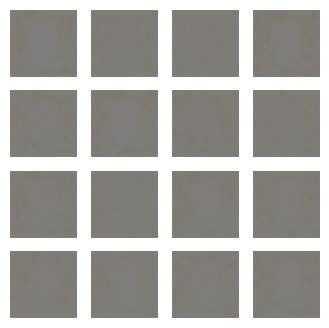

34/34 ━━━━━━━━━━━━━━━━━━━━ 15s 223ms/step - d_loss: 0.4938 - g_loss: 0.6794
Epoch 2/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - d_loss: 0.3354 - g_loss: 0.7932

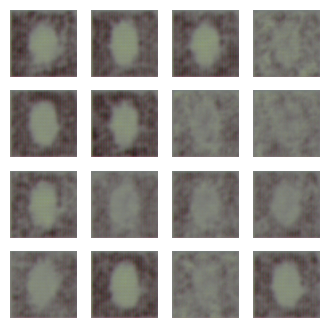

34/34 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step - d_loss: 0.3352 - g_loss: 0.7948
Epoch 3/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.5850 - g_loss: 0.9040

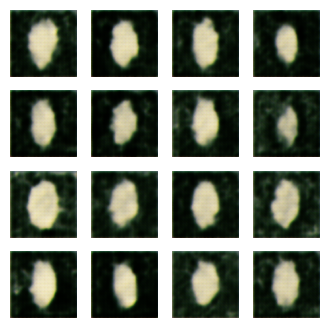

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - d_loss: 0.5850 - g_loss: 0.9048
Epoch 4/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6246 - g_loss: 0.8082

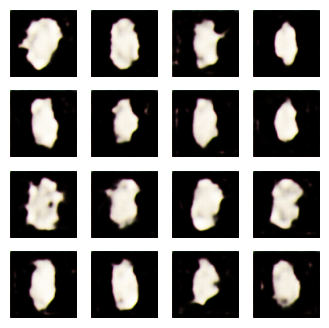

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.6252 - g_loss: 0.8087
Epoch 5/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6488 - g_loss: 0.8006

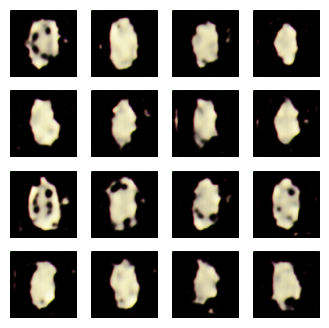

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - d_loss: 0.6500 - g_loss: 0.7994
Epoch 6/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - d_loss: 0.6864 - g_loss: 0.7423

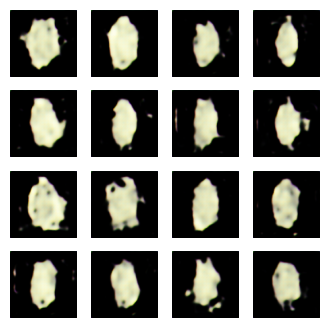

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - d_loss: 0.6869 - g_loss: 0.7422
Epoch 7/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - d_loss: 0.7031 - g_loss: 0.7179

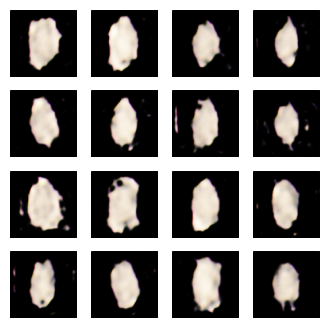

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - d_loss: 0.7030 - g_loss: 0.7184
Epoch 8/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.7074 - g_loss: 0.7076

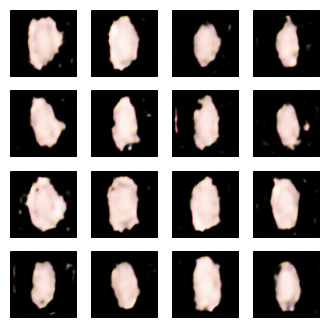

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - d_loss: 0.7076 - g_loss: 0.7077
Epoch 9/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6924 - g_loss: 0.7142

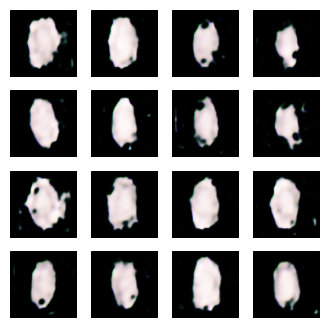

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.6923 - g_loss: 0.7146
Epoch 10/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6753 - g_loss: 0.7454

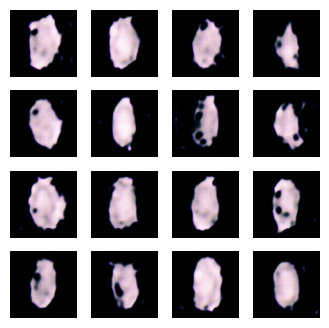

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.6763 - g_loss: 0.7448
Epoch 11/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - d_loss: 0.7005 - g_loss: 0.7496

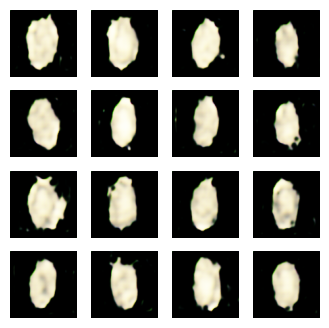

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.7003 - g_loss: 0.7485
Epoch 12/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6730 - g_loss: 0.7582

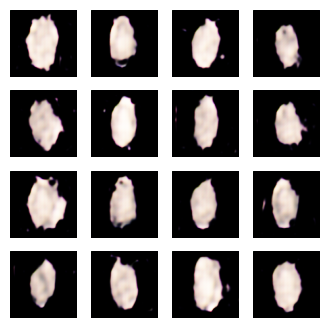

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.6736 - g_loss: 0.7575
Epoch 13/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6973 - g_loss: 0.7095

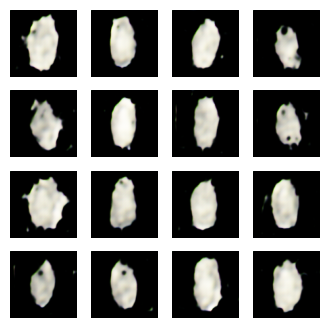

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - d_loss: 0.6971 - g_loss: 0.7100
Epoch 14/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.7108 - g_loss: 0.6862

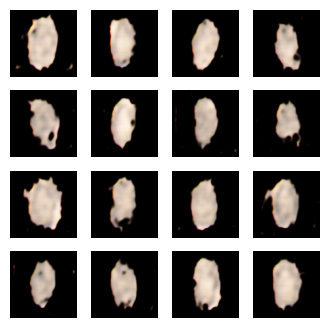

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - d_loss: 0.7103 - g_loss: 0.6871
Epoch 15/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6876 - g_loss: 0.7114

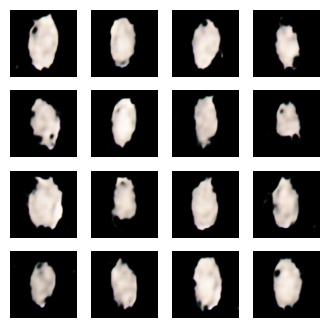

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - d_loss: 0.6875 - g_loss: 0.7118
Epoch 16/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6934 - g_loss: 0.7153

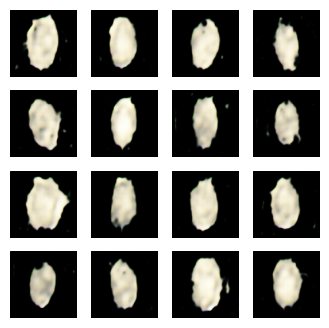

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - d_loss: 0.6934 - g_loss: 0.7150
Epoch 17/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6838 - g_loss: 0.7164

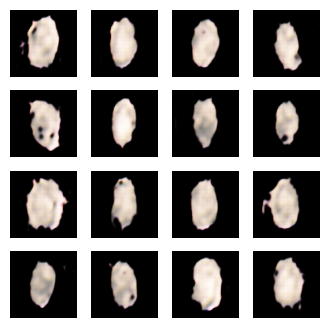

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - d_loss: 0.6840 - g_loss: 0.7163
Epoch 18/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6854 - g_loss: 0.7172

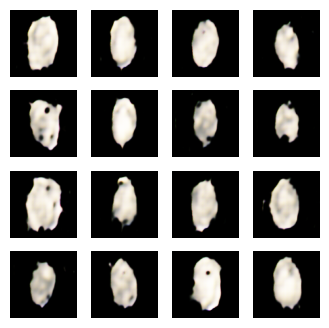

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - d_loss: 0.6855 - g_loss: 0.7169
Epoch 19/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6926 - g_loss: 0.7062

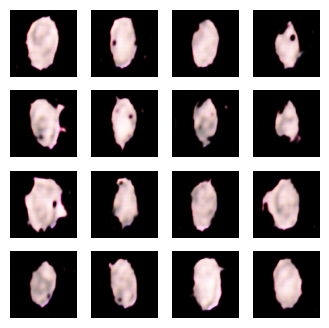

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - d_loss: 0.6926 - g_loss: 0.7063
Epoch 20/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6923 - g_loss: 0.7136

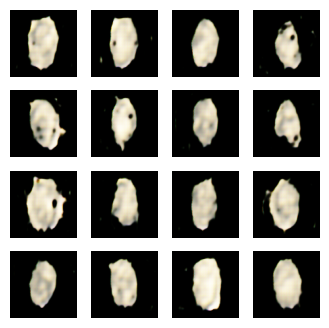

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - d_loss: 0.6924 - g_loss: 0.7134
Epoch 21/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - d_loss: 0.6960 - g_loss: 0.7158

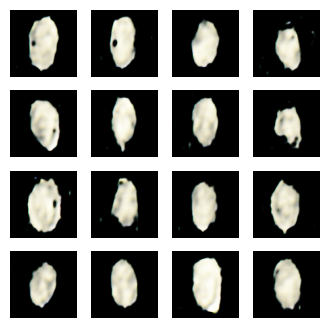

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - d_loss: 0.6963 - g_loss: 0.7165
Epoch 22/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6939 - g_loss: 0.7053

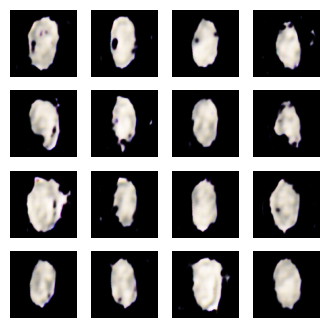

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - d_loss: 0.6936 - g_loss: 0.7055
Epoch 23/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.7006 - g_loss: 0.6957

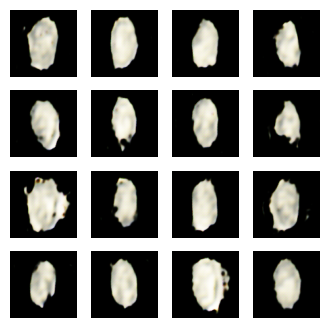

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.7003 - g_loss: 0.6960
Epoch 24/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6943 - g_loss: 0.6990

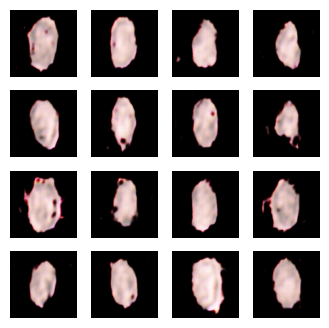

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.6942 - g_loss: 0.6993
Epoch 25/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6863 - g_loss: 0.7120

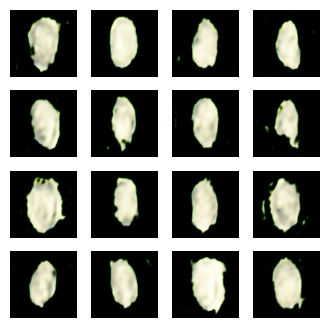

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.6866 - g_loss: 0.7118
Epoch 26/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - d_loss: 0.6896 - g_loss: 0.7143

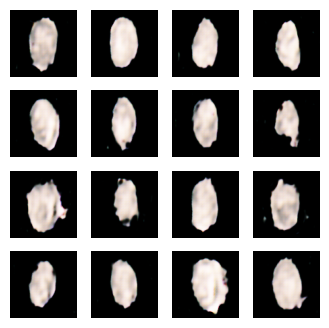

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - d_loss: 0.6896 - g_loss: 0.7145
Epoch 27/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - d_loss: 0.7004 - g_loss: 0.6952

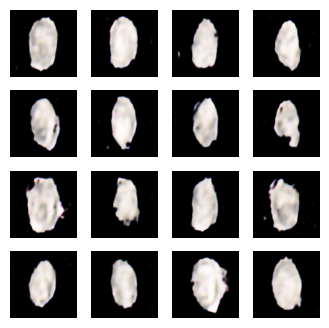

34/34 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - d_loss: 0.6999 - g_loss: 0.6962
Epoch 28/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.7009 - g_loss: 0.7201

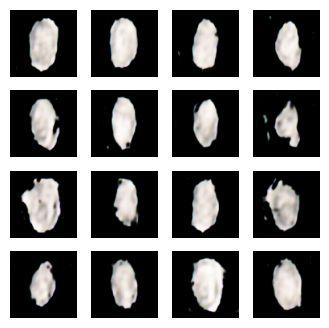

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.7005 - g_loss: 0.7204
Epoch 29/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6917 - g_loss: 0.7136

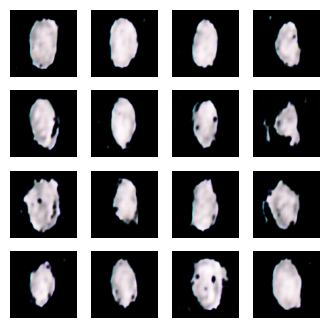

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - d_loss: 0.6921 - g_loss: 0.7136
Epoch 30/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6816 - g_loss: 0.7313

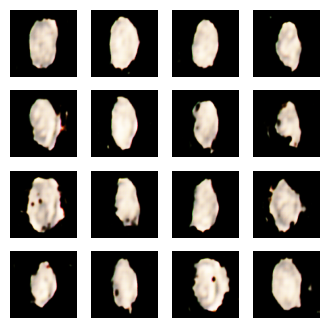

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - d_loss: 0.6818 - g_loss: 0.7309
Epoch 31/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6971 - g_loss: 0.7169

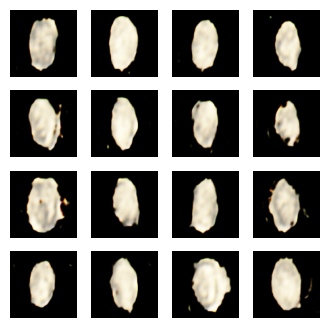

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.6967 - g_loss: 0.7171
Epoch 32/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - d_loss: 0.6937 - g_loss: 0.7015

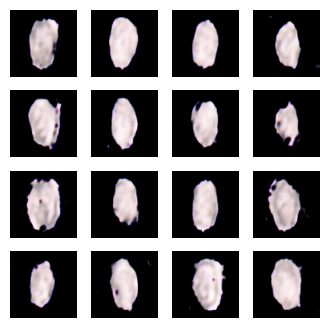

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - d_loss: 0.6935 - g_loss: 0.7021
Epoch 33/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6973 - g_loss: 0.7063

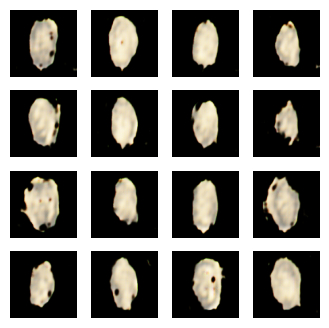

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - d_loss: 0.6970 - g_loss: 0.7064
Epoch 34/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6814 - g_loss: 0.7333

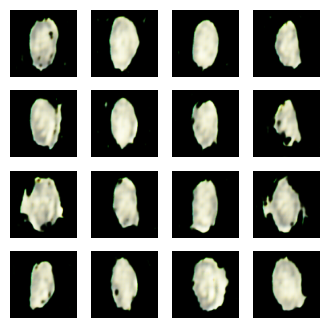

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.6818 - g_loss: 0.7326
Epoch 35/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6909 - g_loss: 0.6954

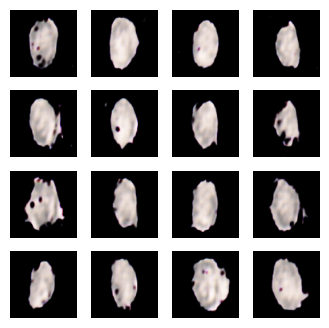

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.6906 - g_loss: 0.6962
Epoch 36/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6902 - g_loss: 0.7140

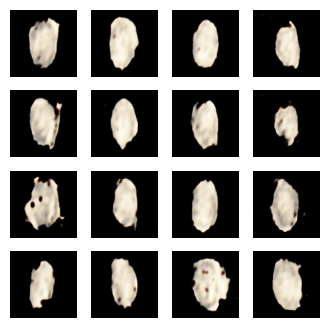

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - d_loss: 0.6901 - g_loss: 0.7138
Epoch 37/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - d_loss: 0.6943 - g_loss: 0.7046

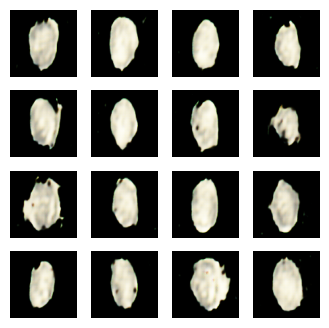

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - d_loss: 0.6941 - g_loss: 0.7048
Epoch 38/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6875 - g_loss: 0.7090

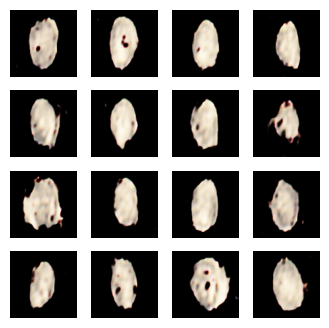

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - d_loss: 0.6874 - g_loss: 0.7094
Epoch 39/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6943 - g_loss: 0.7108

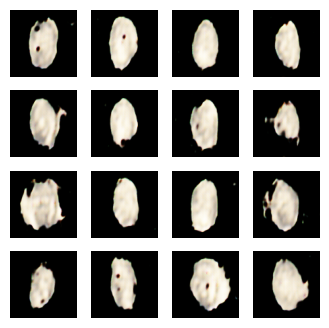

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - d_loss: 0.6940 - g_loss: 0.7109
Epoch 40/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6889 - g_loss: 0.7244

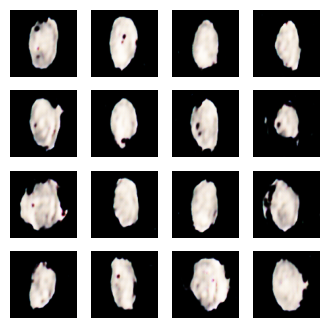

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - d_loss: 0.6889 - g_loss: 0.7241
Epoch 41/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6908 - g_loss: 0.7145

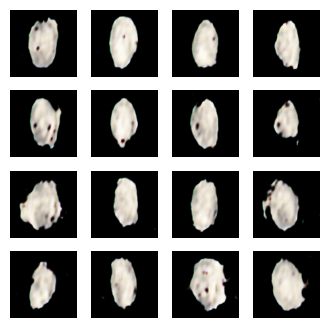

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.6907 - g_loss: 0.7146
Epoch 42/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6889 - g_loss: 0.7117

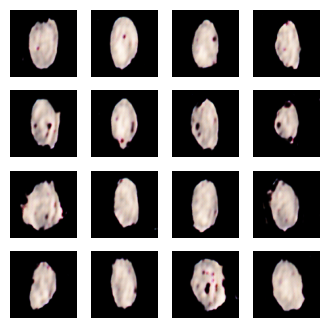

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - d_loss: 0.6890 - g_loss: 0.7114
Epoch 43/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6878 - g_loss: 0.7166

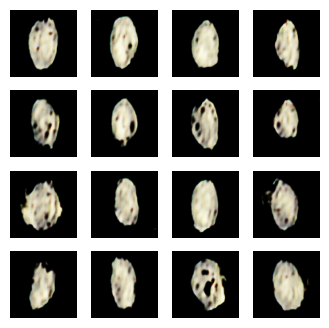

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - d_loss: 0.6879 - g_loss: 0.7166
Epoch 44/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6905 - g_loss: 0.7298

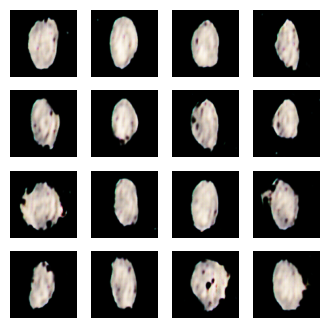

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - d_loss: 0.6906 - g_loss: 0.7291
Epoch 45/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6883 - g_loss: 0.7175

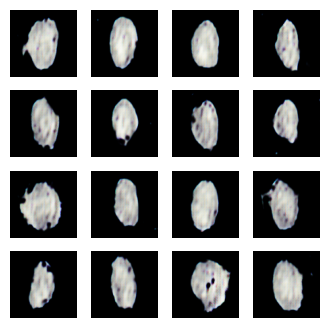

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - d_loss: 0.6885 - g_loss: 0.7175
Epoch 46/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6892 - g_loss: 0.7382

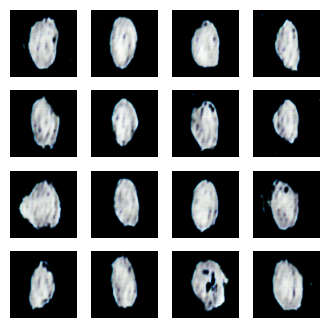

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.6897 - g_loss: 0.7376
Epoch 47/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6777 - g_loss: 0.7361

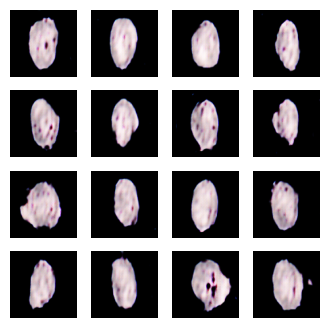

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - d_loss: 0.6782 - g_loss: 0.7355
Epoch 48/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6963 - g_loss: 0.7241

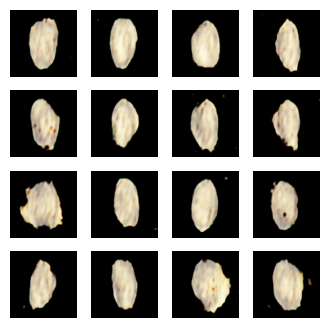

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - d_loss: 0.6963 - g_loss: 0.7234
Epoch 49/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6815 - g_loss: 0.7251

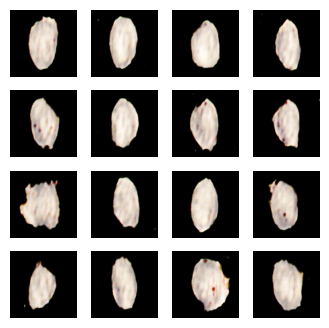

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - d_loss: 0.6819 - g_loss: 0.7243
Epoch 50/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6871 - g_loss: 0.7099

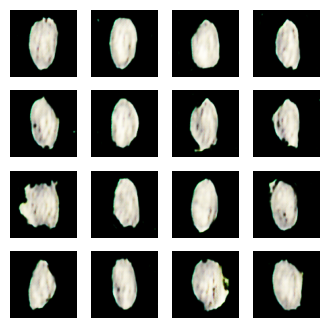

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - d_loss: 0.6872 - g_loss: 0.7101
Epoch 51/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6901 - g_loss: 0.7046

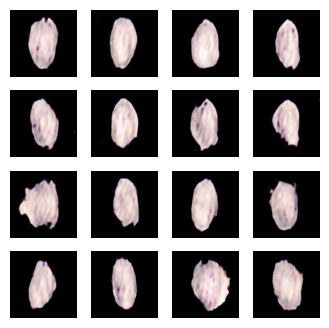

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.6902 - g_loss: 0.7051
Epoch 52/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6929 - g_loss: 0.7062

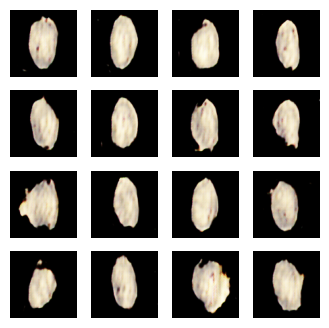

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.6928 - g_loss: 0.7063
Epoch 53/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6869 - g_loss: 0.7113

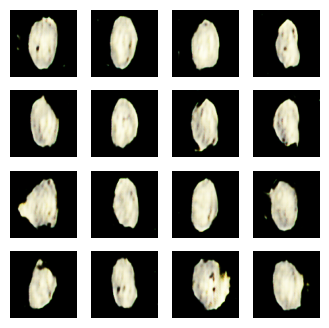

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - d_loss: 0.6869 - g_loss: 0.7114
Epoch 54/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6918 - g_loss: 0.7172

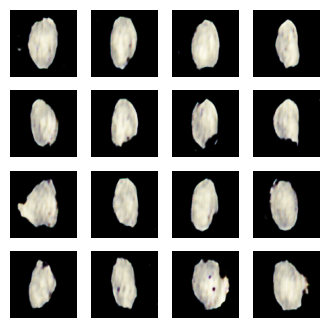

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.6917 - g_loss: 0.7171
Epoch 55/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6885 - g_loss: 0.7045

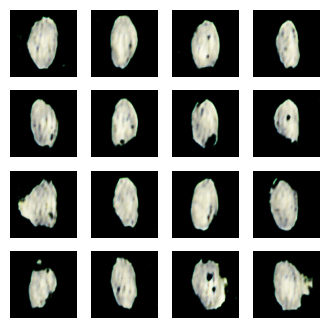

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - d_loss: 0.6885 - g_loss: 0.7050
Epoch 56/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6905 - g_loss: 0.7160

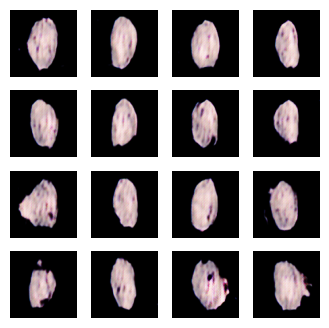

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - d_loss: 0.6905 - g_loss: 0.7157
Epoch 57/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6840 - g_loss: 0.7221

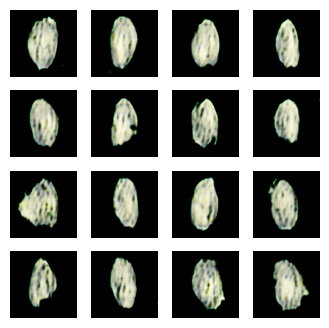

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.6843 - g_loss: 0.7218
Epoch 58/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6822 - g_loss: 0.7234

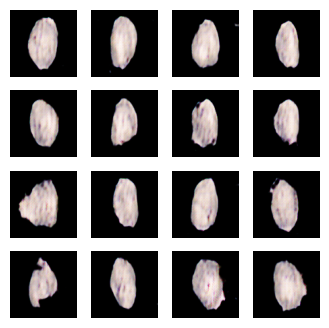

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - d_loss: 0.6826 - g_loss: 0.7227
Epoch 59/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - d_loss: 0.6861 - g_loss: 0.7205

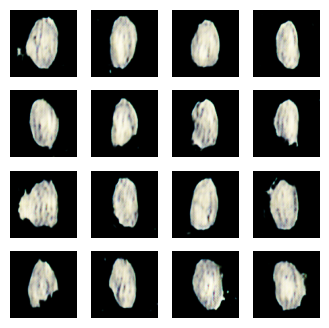

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - d_loss: 0.6861 - g_loss: 0.7206
Epoch 60/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6967 - g_loss: 0.7064

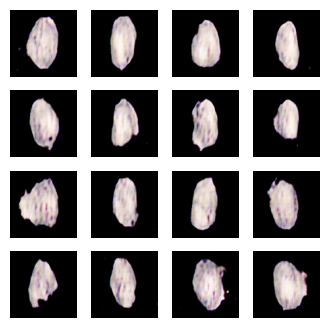

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - d_loss: 0.6964 - g_loss: 0.7069
Epoch 61/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6931 - g_loss: 0.7155

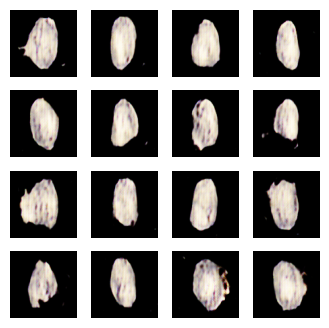

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - d_loss: 0.6930 - g_loss: 0.7154
Epoch 62/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6879 - g_loss: 0.7203

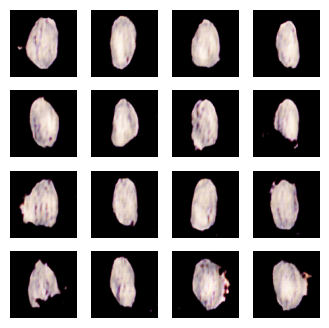

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - d_loss: 0.6879 - g_loss: 0.7199
Epoch 63/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6852 - g_loss: 0.7108

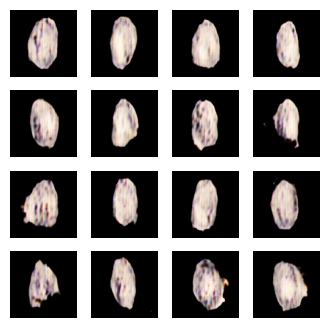

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - d_loss: 0.6853 - g_loss: 0.7107
Epoch 64/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6858 - g_loss: 0.7202

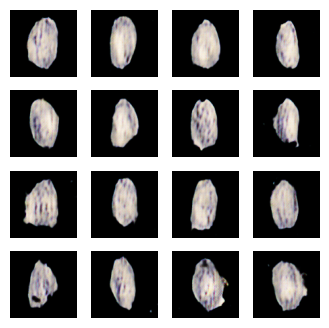

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.6859 - g_loss: 0.7200
Epoch 65/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6874 - g_loss: 0.7054

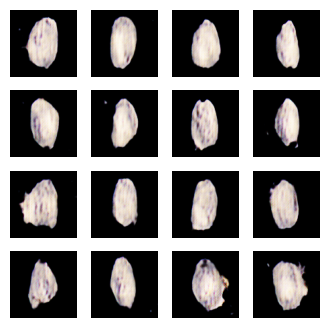

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - d_loss: 0.6875 - g_loss: 0.7057
Epoch 66/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6879 - g_loss: 0.7093

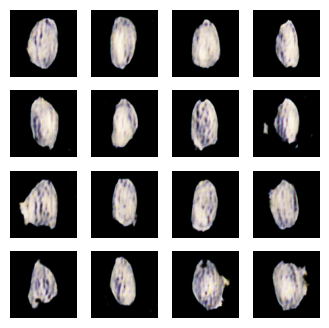

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - d_loss: 0.6878 - g_loss: 0.7095
Epoch 67/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6895 - g_loss: 0.7131

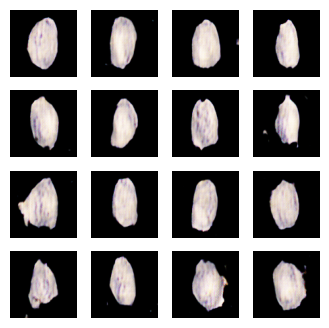

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.6895 - g_loss: 0.7129
Epoch 68/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6897 - g_loss: 0.7112

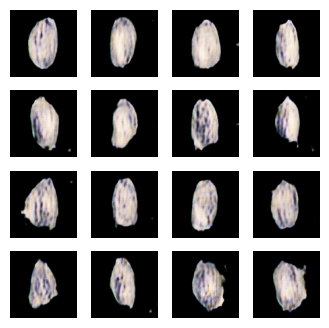

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - d_loss: 0.6898 - g_loss: 0.7113
Epoch 69/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6906 - g_loss: 0.7113

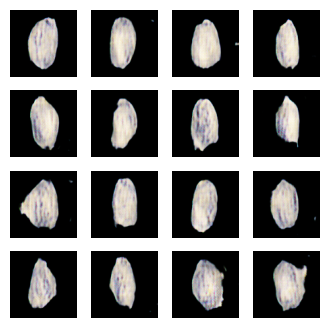

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - d_loss: 0.6906 - g_loss: 0.7113
Epoch 70/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6876 - g_loss: 0.7135

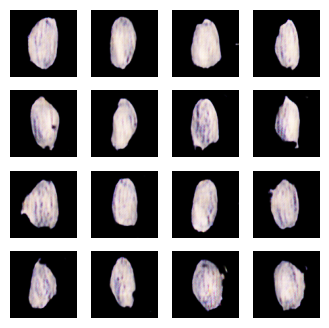

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - d_loss: 0.6877 - g_loss: 0.7133
Epoch 71/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6881 - g_loss: 0.7200

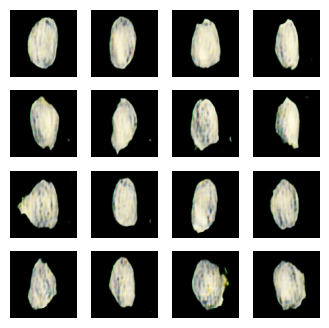

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - d_loss: 0.6883 - g_loss: 0.7195
Epoch 72/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6906 - g_loss: 0.7072

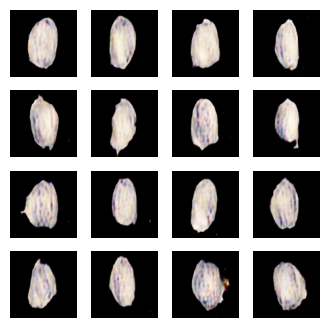

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - d_loss: 0.6906 - g_loss: 0.7074
Epoch 73/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6881 - g_loss: 0.7048

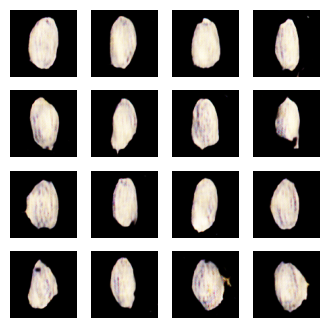

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - d_loss: 0.6881 - g_loss: 0.7050
Epoch 74/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - d_loss: 0.6859 - g_loss: 0.7092

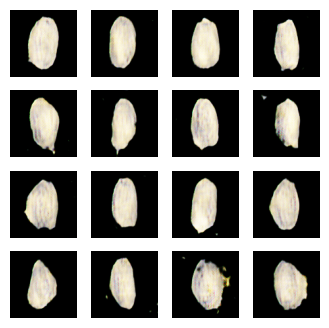

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step - d_loss: 0.6860 - g_loss: 0.7095
Epoch 75/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6909 - g_loss: 0.7034

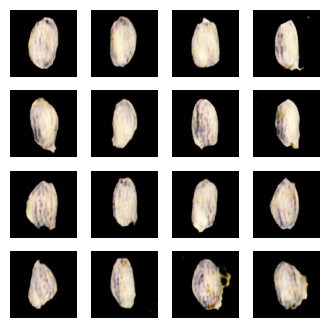

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - d_loss: 0.6909 - g_loss: 0.7038
Epoch 76/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6880 - g_loss: 0.7098

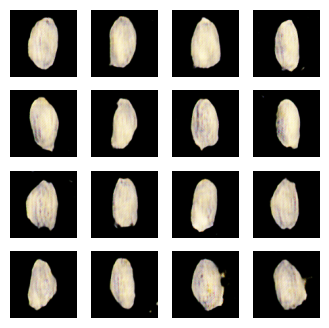

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - d_loss: 0.6880 - g_loss: 0.7098
Epoch 77/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6892 - g_loss: 0.7179

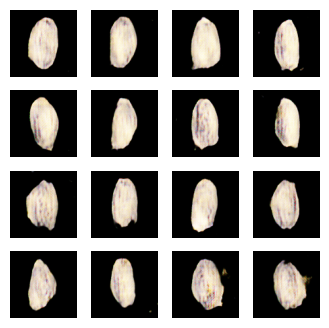

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - d_loss: 0.6893 - g_loss: 0.7177
Epoch 78/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6868 - g_loss: 0.7206

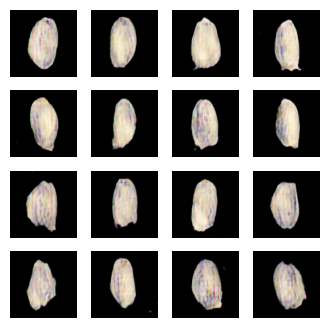

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - d_loss: 0.6869 - g_loss: 0.7202
Epoch 79/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - d_loss: 0.6878 - g_loss: 0.7070

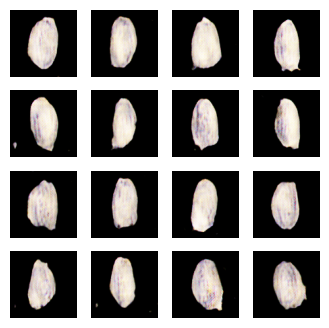

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - d_loss: 0.6878 - g_loss: 0.7072
Epoch 80/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6858 - g_loss: 0.7175

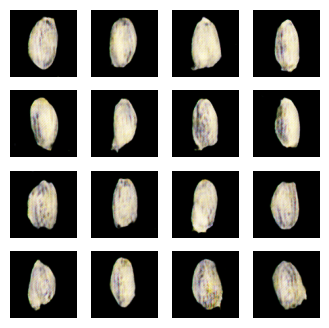

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - d_loss: 0.6860 - g_loss: 0.7174
Epoch 81/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6899 - g_loss: 0.7030

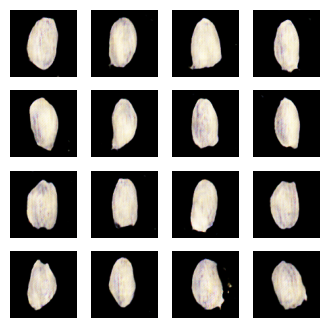

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - d_loss: 0.6899 - g_loss: 0.7033
Epoch 82/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6863 - g_loss: 0.7144

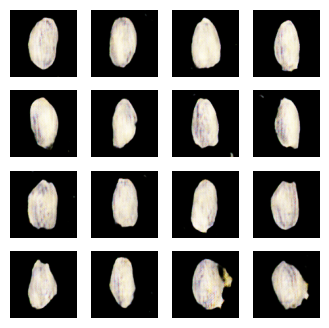

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - d_loss: 0.6864 - g_loss: 0.7144
Epoch 83/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6897 - g_loss: 0.7143

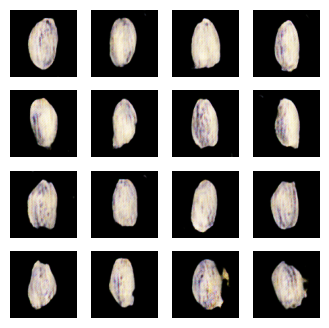

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - d_loss: 0.6896 - g_loss: 0.7142
Epoch 84/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6878 - g_loss: 0.7122

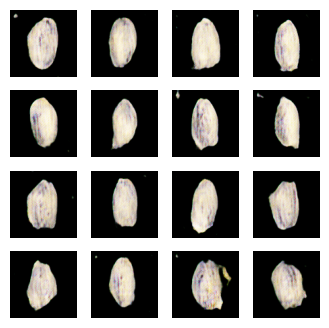

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - d_loss: 0.6878 - g_loss: 0.7123
Epoch 85/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6925 - g_loss: 0.7093

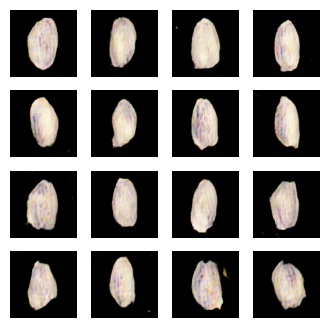

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - d_loss: 0.6924 - g_loss: 0.7097
Epoch 86/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6888 - g_loss: 0.7062

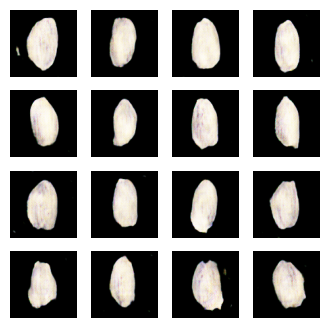

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - d_loss: 0.6888 - g_loss: 0.7064
Epoch 87/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6855 - g_loss: 0.7257

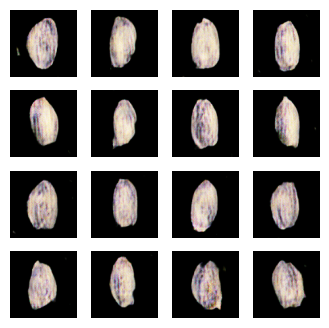

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - d_loss: 0.6857 - g_loss: 0.7253
Epoch 88/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6874 - g_loss: 0.7229

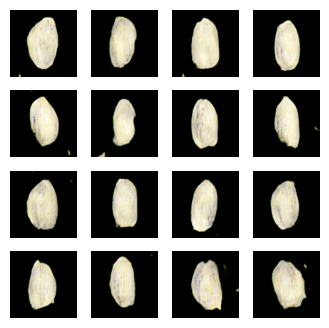

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - d_loss: 0.6875 - g_loss: 0.7227
Epoch 89/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6854 - g_loss: 0.7244

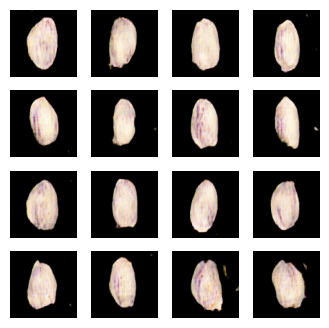

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - d_loss: 0.6855 - g_loss: 0.7241
Epoch 90/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6907 - g_loss: 0.7135

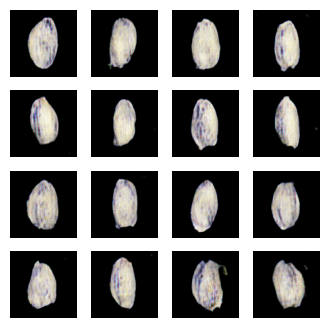

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - d_loss: 0.6906 - g_loss: 0.7136
Epoch 91/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6829 - g_loss: 0.7204

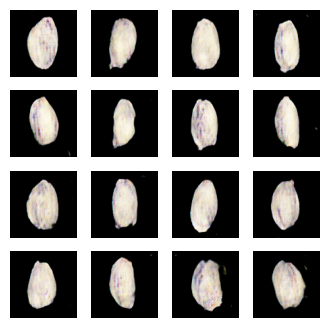

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - d_loss: 0.6831 - g_loss: 0.7201
Epoch 92/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6888 - g_loss: 0.7165

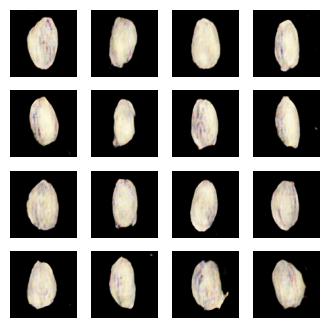

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - d_loss: 0.6887 - g_loss: 0.7166
Epoch 93/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6903 - g_loss: 0.7132

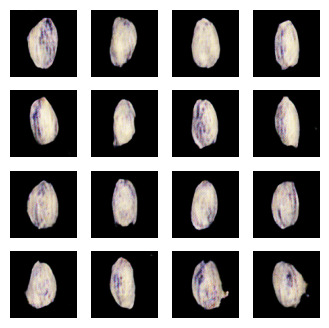

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - d_loss: 0.6902 - g_loss: 0.7133
Epoch 94/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6834 - g_loss: 0.7219

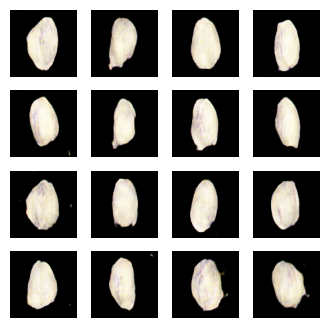

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - d_loss: 0.6835 - g_loss: 0.7219
Epoch 95/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6884 - g_loss: 0.7180

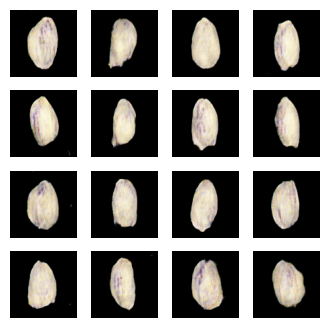

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - d_loss: 0.6883 - g_loss: 0.7181
Epoch 96/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6905 - g_loss: 0.7284

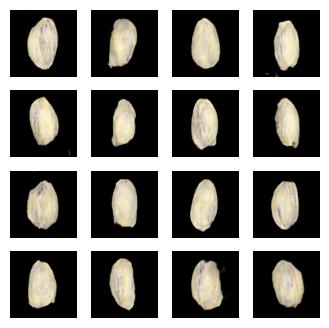

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - d_loss: 0.6904 - g_loss: 0.7284
Epoch 97/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6916 - g_loss: 0.7281

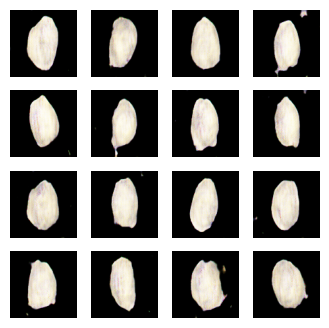

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - d_loss: 0.6916 - g_loss: 0.7283
Epoch 98/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - d_loss: 0.6870 - g_loss: 0.7199

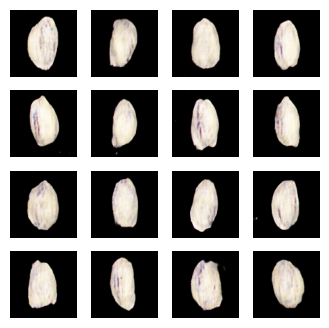

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - d_loss: 0.6869 - g_loss: 0.7200
Epoch 99/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6858 - g_loss: 0.7268

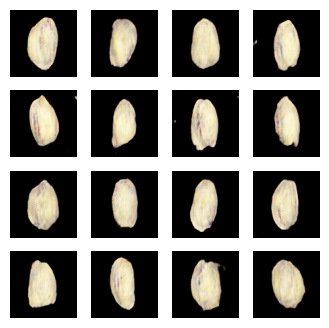

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - d_loss: 0.6857 - g_loss: 0.7267
Epoch 100/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.6902 - g_loss: 0.7170

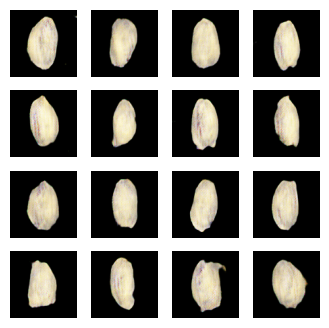

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - d_loss: 0.6899 - g_loss: 0.7174


In [27]:
# Training
EPOCHS = 100
history = gan.fit(
    train_dataset,
    epochs=EPOCHS,
    callbacks=[GANMonitor()]
)

menjalankan proses training GAN selama 100 epoch

Setelah 100 epoch pelatihan, generator GAN sudah mampu menghasilkan gambar biji (kirmizi) yang secara visual cukup konsisten dan realistis. Semua gambar menunjukkan bentuk yang menyerupai objek asli (kirmizi), dengan latar belakang hitam yang bersih dan bentuk gambar yang cukup seragam. Beberapa variasi bentuk dan arah rotasi masih kelihatan, yang merupakan indikasi bahwa model menangkap keberagaman data asli.

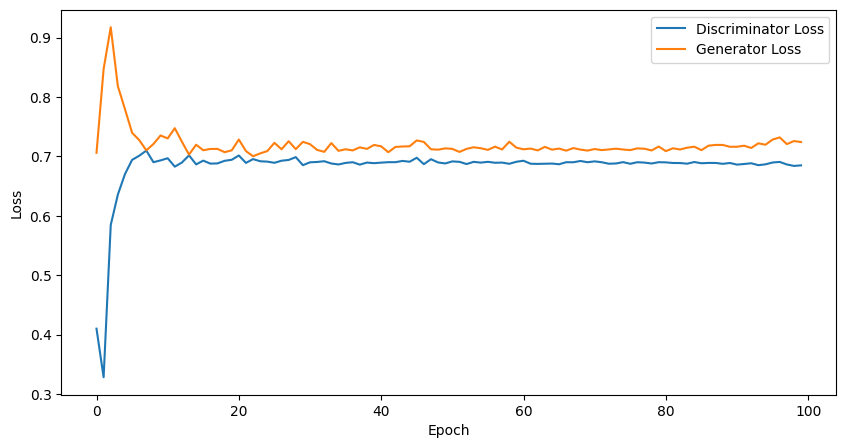

In [28]:
# Plot training progress
plt.figure(figsize=(10, 5))
plt.plot(history.history['d_loss'], label='Discriminator Loss')
plt.plot(history.history['g_loss'], label='Generator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

Pada awal training, terjadi fluktuasi yang cukup tajam pada kedua loss, terutama pada generator. Namun setelah sekitar 10 – 15 epoch, kedua loss mulai stabil. Discriminator loss berkisar di angka 0.68, sementara generator loss sedikit lebih tinggi, yaitu sekitar 0.72. Pola ini menunjukkan bahwa setelah tahap awal pelatihan, grafik generator dan discriminator menjadi seimbang, di mana generator cukup mampu menghasilkan gambar yang bisa mengecoh discriminator, namun tidak sepenuhnya dominan. Jadi Stabilitas loss ini menandakan bahwa model berhasil mencapai keseimbangan yang relatif stabil antara kedua jaringan

# B

## MODIFIED GAN MODEL

In [143]:
import time

# Konfigurasi Model yang Dimodifikasi

IMG_WIDTH = 100
IMG_HEIGHT = 100
CHANNELS = 3
LATENT_DIM = 128  # Diperbesar untuk potensi representasi yang lebih beragam
BATCH_SIZE = 64   # Batch size lebih besar supaya bisa lebih stabil
LEARNING_RATE = 0.0002
ADAM_BETA_1 = 0.5 # Nilai standar untuk training GAN yang stabil

In [144]:
def build_modified_generator():
    # Membangun Generator dengan arsitektur DCGAN-style
    model = tf.keras.Sequential(name="Modified_Generator")

    # Proyeksi noise ke ruang dimensi yang lebih kecil untuk memulai konvolusi
    # 25x25 adalah 1/4 dari 100x100, jadi kita butuh 2x upsampling dengan stride 2
    model.add(layers.Dense(25 * 25 * 128, use_bias=False, input_shape=(LATENT_DIM,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Reshape((25, 25, 128)))

    # Layer 1: Upsampling dari 25x25 ke 50x50

    # kita modifikasi stride menjadi 2.
    model.add(layers.Conv2DTranspose(64, (3, 3), strides=2, padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Layer 2: Upsampling dari 50x50 ke 100x100
    model.add(layers.Conv2DTranspose(32, (3, 3), strides=2, padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Layer 3: Konvolusi akhir untuk menyempurnakan fitur
    model.add(layers.Conv2D(16, (3, 3), strides=1, padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Layer Output: Menghasilkan gambar 100x100x3
    # Menggunakan kernel 5x5 untuk cakupan lebih luas di akhir
    model.add(layers.Conv2D(CHANNELS, (5, 5), strides=1, padding='same', activation='tanh'))

    return model

Membuat Generator modifikasi menggunakan arsitektur DCGAN-style, dimulai dari proyeksi noise menjadi fitur awal berukuran 25 × 25, kemudian melakukan dua tahap upsampling hingga mencapai ukuran 100 × 100 piksel, dan diakhiri dengan beberapa lapisan konvolusi untuk menyempurnakan detail gambar, dengan output dalam rentang [-1, 1] menggunakan aktivasi tanh.

In [145]:
def build_modified_discriminator():
    # Membangun Diskriminator dengan arsitektur DCGAN-style.
    model = tf.keras.Sequential(name="Modified_Discriminator")

    # Layer 1: 100x100 -> 50x50
    # Sesuai permintaan: 16 kernels, 3x3. Stride 2 untuk downsampling.
    model.add(layers.Conv2D(16, (3, 3), strides=2, padding='same',
                                     input_shape=[IMG_HEIGHT, IMG_WIDTH, CHANNELS]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Layer 2: 50x50 -> 25x25
    model.add(layers.Conv2D(32, (3, 3), strides=2, padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Layer 3:
    model.add(layers.Conv2D(64, (3, 3), strides=1, padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Flatten dan Layer Output
    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation='sigmoid')) # Sesuai permintaan

    return model

Membuat Diskriminator modifikasi dengan mengikuti arsitektur DCGAN dengan tiga lapisan konvolusi yang secara bertahap mengecilkan resolusi gambar dari 100 × 100 menjadi fitur yang lebih padat, menggunakan aktivasi LeakyReLU dan dropout untuk regularisasi, lalu mengklasifikasikan gambar sebagai asli atau palsu melalui lapisan output sigmoid.

In [146]:
# Inisialisasi model
generator = build_modified_generator()
discriminator = build_modified_discriminator()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


menginisialisasi arsitektur modifikasi dari generator dan diskriminator, yang dirancang dengan gaya DCGAN, untuk digunakan dalam training model GAN yang lebih stabil dan mampu menghasilkan gambar dengan kualitas lebih baik.

In [147]:
print("--- Arsitektur Generator ---")
generator.summary()
print("\n--- Arsitektur Diskriminator ---")
discriminator.summary()

--- Arsitektur Generator ---


Model: "Modified_Generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                │ (None, 80000)          │    10,240,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_50          │ (None, 80000)          │       320,000 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_74 (LeakyReLU)      │ (None, 80000)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_10 (Reshape)            │ (None, 25, 25, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_38             │ (None, 50, 50, 64)     │        73,728 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_51          │ (None, 50, 50, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_75 (LeakyReLU)      │ (None, 50, 50, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_39             │ (None, 100, 100, 32)   │        18,432 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_52          │ (None, 100, 100, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_76 (LeakyReLU)      │ (None, 100, 100, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_44 (Conv2D)              │ (None, 100, 100, 16)   │         4,608 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_53          │ (None, 100, 100, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_77 (LeakyReLU)      │ (None, 100, 100, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_45 (Conv2D)              │ (None, 100, 100, 3)    │         1,203 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,658,419 (40.66 MB)

 Trainable params: 10,498,195 (40.05 MB)

 Non-trainable params: 160,224 (625.88 KB)


--- Arsitektur Diskriminator ---


Model: "Modified_Discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_46 (Conv2D)              │ (None, 50, 50, 16)     │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_78 (LeakyReLU)      │ (None, 50, 50, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_33 (Dropout)            │ (None, 50, 50, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_47 (Conv2D)              │ (None, 25, 25, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_79 (LeakyReLU)      │ (None, 25, 25, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_34 (Dropout)            │ (None, 25, 25, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_48 (Conv2D)              │ (None, 25, 25, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_80 (LeakyReLU)      │ (None, 25, 25, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_35 (Dropout)            │ (None, 25, 25, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_14 (Flatten)            │ (None, 40000)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 1)              │        40,001 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 63,585 (248.38 KB)

 Trainable params: 63,585 (248.38 KB)

 Non-trainable params: 0 (0.00 B)

In [148]:
# Mendefinisikan Optimizer dan Loss
# Menggunakan optimizer dan loss function sesuai permintaan
generator_optimizer = tf.keras.optimizers.Adam(LEARNING_RATE, beta_1=ADAM_BETA_1)
discriminator_optimizer = tf.keras.optimizers.Adam(LEARNING_RATE, beta_1=ADAM_BETA_1)
cross_entropy = tf.keras.losses.BinaryCrossentropy()


menetapkan optimizer Adam untuk generator dan diskriminator dengan parameter learning_rate dan beta_1, dan menggunakan fungsi loss BinaryCrossentropy untuk mengukur seberapa baik model membedakan antara gambar asli dan palsu.

In [149]:
# Mendefinisikan Training Step
# Fungsi ini akan dieksekusi untuk setiap batch
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, LATENT_DIM])

    # Gunakan GradientTape untuk merekam operasi untuk diferensiasi otomatis
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        # Hitung loss untuk kedua model
        gen_loss = cross_entropy(tf.ones_like(fake_output), fake_output)

        real_loss = cross_entropy(tf.ones_like(real_output), real_output)
        fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
        disc_loss = real_loss + fake_loss

    # Hitung gradien dan terapkan ke optimizer
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

membuat fungsi train_step untuk menjalankan satu langkah pelatihan GAN untuk setiap batch, dengan menghasilkan gambar palsu dari noise, menghitung prediksi diskriminator terhadap gambar asli dan palsu, lalu menghitung dan menerapkan gradien loss untuk memperbarui bobot generator dan diskriminator secara bersamaan menggunakan GradientTape.

In [150]:
# Fungsi untuk Training dan Visualisasi
# Seed untuk menghasilkan gambar yang konsisten untuk perbandingan antar epoch
num_examples_to_generate = 16
seed = tf.random.normal([num_examples_to_generate, LATENT_DIM])

menyiapkan seed tetap berupa 16 vektor noise acak yang akan digunakan untuk menghasilkan gambar secara konsisten di setiap epoch, sehingga memudahkan perbandingan visual kualitas hasil generator selama proses training.

In [151]:
def train(dataset, epochs):
    history = {'gen_loss': [], 'disc_loss': []}

    for epoch in range(epochs):
        start = time.time()

        gen_loss_epoch = []
        disc_loss_epoch = []

        for image_batch in dataset:
            g_loss, d_loss = train_step(image_batch)
            gen_loss_epoch.append(g_loss)
            disc_loss_epoch.append(d_loss)

        # Rata-rata loss per epoch
        avg_gen_loss = np.mean(gen_loss_epoch)
        avg_disc_loss = np.mean(disc_loss_epoch)

        history['gen_loss'].append(avg_gen_loss)
        history['disc_loss'].append(avg_disc_loss)

        # Tampilkan hasil dan simpan gambar setiap beberapa epoch
        print (f'Epoch {epoch + 1}, Gen Loss: {avg_gen_loss}, Disc Loss: {avg_disc_loss}, Time: {time.time()-start:.2f} sec')
        if (epoch + 1) % 10 == 0:
            generate_and_save_images(generator, epoch + 1, seed)

    # Generate gambar terakhir
    generate_and_save_images(generator, epochs, seed)
    return history

membuat fungsi train untuk menjalankan proses pelatihan GAN selama sejumlah epoch yang ditentukan, mencatat rata-rata loss generator dan diskriminator di setiap epoch, serta secara berkala menampilkan dan menyimpan gambar hasil generator untuk memantau perkembangan kualitas gambar selama training.

Epoch 1, Gen Loss: 1.2046046257019043, Disc Loss: 0.5472083687782288, Time: 12.93 sec
Epoch 2, Gen Loss: 1.6939778327941895, Disc Loss: 0.36379119753837585, Time: 3.35 sec
Epoch 3, Gen Loss: 1.0726962089538574, Disc Loss: 1.2037904262542725, Time: 3.37 sec
Epoch 4, Gen Loss: 0.8765755891799927, Disc Loss: 1.18294095993042, Time: 3.39 sec
Epoch 5, Gen Loss: 0.8791391849517822, Disc Loss: 1.242339849472046, Time: 3.39 sec
Epoch 6, Gen Loss: 0.8590185046195984, Disc Loss: 1.276912808418274, Time: 3.41 sec
Epoch 7, Gen Loss: 0.8191349506378174, Disc Loss: 1.2928121089935303, Time: 3.43 sec
Epoch 8, Gen Loss: 0.776364803314209, Disc Loss: 1.3406387567520142, Time: 3.44 sec
Epoch 9, Gen Loss: 0.7473435401916504, Disc Loss: 1.384832739830017, Time: 3.45 sec
Epoch 10, Gen Loss: 0.7518704533576965, Disc Loss: 1.3786208629608154, Time: 3.46 sec


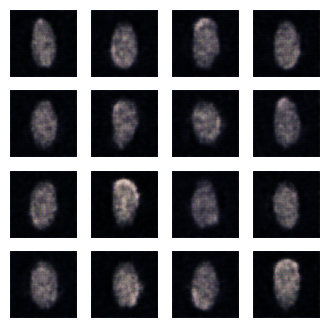

Epoch 11, Gen Loss: 0.7120026350021362, Disc Loss: 1.425721526145935, Time: 3.48 sec
Epoch 12, Gen Loss: 0.7144635915756226, Disc Loss: 1.4207335710525513, Time: 3.47 sec
Epoch 13, Gen Loss: 0.7103631496429443, Disc Loss: 1.4150683879852295, Time: 3.49 sec
Epoch 14, Gen Loss: 0.7200239300727844, Disc Loss: 1.3983639478683472, Time: 3.47 sec
Epoch 15, Gen Loss: 0.6988885402679443, Disc Loss: 1.4372493028640747, Time: 3.46 sec
Epoch 16, Gen Loss: 0.7038583755493164, Disc Loss: 1.4223480224609375, Time: 3.44 sec
Epoch 17, Gen Loss: 0.6971880793571472, Disc Loss: 1.4318058490753174, Time: 3.43 sec
Epoch 18, Gen Loss: 0.7065415382385254, Disc Loss: 1.4247223138809204, Time: 3.43 sec
Epoch 19, Gen Loss: 0.6962652206420898, Disc Loss: 1.435943603515625, Time: 3.41 sec
Epoch 20, Gen Loss: 0.7052021026611328, Disc Loss: 1.4105232954025269, Time: 3.41 sec


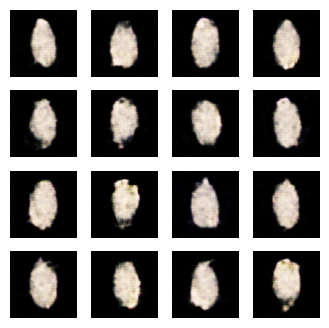

Epoch 21, Gen Loss: 0.7068564891815186, Disc Loss: 1.4087969064712524, Time: 3.41 sec
Epoch 22, Gen Loss: 0.6955423951148987, Disc Loss: 1.4185726642608643, Time: 3.41 sec
Epoch 23, Gen Loss: 0.7061477303504944, Disc Loss: 1.4052696228027344, Time: 3.40 sec
Epoch 24, Gen Loss: 0.6974595785140991, Disc Loss: 1.417738437652588, Time: 3.40 sec
Epoch 25, Gen Loss: 0.7030636072158813, Disc Loss: 1.3996667861938477, Time: 3.41 sec
Epoch 26, Gen Loss: 0.6991425156593323, Disc Loss: 1.411954402923584, Time: 3.42 sec
Epoch 27, Gen Loss: 0.7002642750740051, Disc Loss: 1.4065078496932983, Time: 3.41 sec
Epoch 28, Gen Loss: 0.7080024480819702, Disc Loss: 1.3976781368255615, Time: 5.11 sec
Epoch 29, Gen Loss: 0.6974959373474121, Disc Loss: 1.4009191989898682, Time: 3.41 sec
Epoch 30, Gen Loss: 0.6961444020271301, Disc Loss: 1.4210466146469116, Time: 3.42 sec


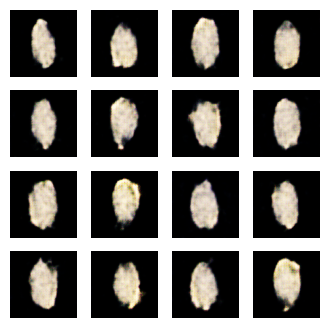

Epoch 31, Gen Loss: 0.6932191848754883, Disc Loss: 1.402214765548706, Time: 3.44 sec
Epoch 32, Gen Loss: 0.6976155042648315, Disc Loss: 1.4101454019546509, Time: 3.43 sec
Epoch 33, Gen Loss: 0.6970617175102234, Disc Loss: 1.396173357963562, Time: 3.43 sec
Epoch 34, Gen Loss: 0.7054474949836731, Disc Loss: 1.3967832326889038, Time: 3.44 sec
Epoch 35, Gen Loss: 0.7093009352684021, Disc Loss: 1.388906717300415, Time: 3.45 sec
Epoch 36, Gen Loss: 0.7341575026512146, Disc Loss: 1.3674840927124023, Time: 3.44 sec
Epoch 37, Gen Loss: 0.7053108811378479, Disc Loss: 1.3957453966140747, Time: 3.44 sec
Epoch 38, Gen Loss: 0.6952961087226868, Disc Loss: 1.4104318618774414, Time: 3.44 sec
Epoch 39, Gen Loss: 0.6939002275466919, Disc Loss: 1.4011963605880737, Time: 3.43 sec
Epoch 40, Gen Loss: 0.6947600245475769, Disc Loss: 1.3988065719604492, Time: 3.43 sec


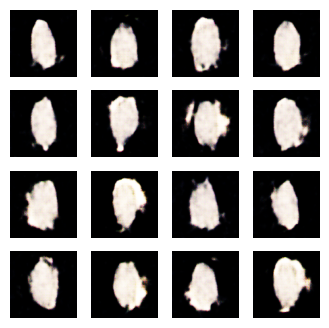

Epoch 41, Gen Loss: 0.6999145150184631, Disc Loss: 1.3980566263198853, Time: 3.43 sec
Epoch 42, Gen Loss: 0.6984637379646301, Disc Loss: 1.3957905769348145, Time: 3.45 sec
Epoch 43, Gen Loss: 0.6966230273246765, Disc Loss: 1.3950133323669434, Time: 3.43 sec
Epoch 44, Gen Loss: 0.6994481086730957, Disc Loss: 1.3919998407363892, Time: 3.42 sec
Epoch 45, Gen Loss: 0.7049641609191895, Disc Loss: 1.3868746757507324, Time: 3.42 sec
Epoch 46, Gen Loss: 0.7045614719390869, Disc Loss: 1.3908610343933105, Time: 3.43 sec
Epoch 47, Gen Loss: 0.7142243385314941, Disc Loss: 1.3781791925430298, Time: 3.42 sec
Epoch 48, Gen Loss: 0.7136403918266296, Disc Loss: 1.3909821510314941, Time: 3.42 sec
Epoch 49, Gen Loss: 0.7004126310348511, Disc Loss: 1.395322561264038, Time: 3.42 sec
Epoch 50, Gen Loss: 0.6941287517547607, Disc Loss: 1.3993886709213257, Time: 3.42 sec


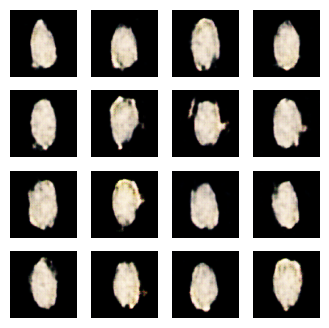

Epoch 51, Gen Loss: 0.7045683860778809, Disc Loss: 1.3850127458572388, Time: 3.43 sec
Epoch 52, Gen Loss: 0.6990048289299011, Disc Loss: 1.3877334594726562, Time: 3.42 sec
Epoch 53, Gen Loss: 0.7004607915878296, Disc Loss: 1.3915272951126099, Time: 3.43 sec
Epoch 54, Gen Loss: 0.6988644003868103, Disc Loss: 1.3923770189285278, Time: 3.42 sec
Epoch 55, Gen Loss: 0.7028446793556213, Disc Loss: 1.3809032440185547, Time: 3.41 sec
Epoch 56, Gen Loss: 0.7068089246749878, Disc Loss: 1.3843715190887451, Time: 3.43 sec
Epoch 57, Gen Loss: 0.7017784714698792, Disc Loss: 1.387582540512085, Time: 3.43 sec
Epoch 58, Gen Loss: 0.705315113067627, Disc Loss: 1.3835396766662598, Time: 3.43 sec
Epoch 59, Gen Loss: 0.7067462801933289, Disc Loss: 1.381977915763855, Time: 3.42 sec
Epoch 60, Gen Loss: 0.7075960636138916, Disc Loss: 1.3761796951293945, Time: 3.43 sec


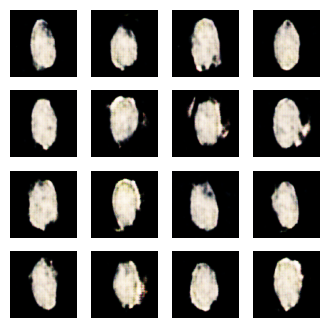

Epoch 61, Gen Loss: 0.7064903378486633, Disc Loss: 1.3818655014038086, Time: 3.43 sec
Epoch 62, Gen Loss: 0.7051162719726562, Disc Loss: 1.3855516910552979, Time: 3.42 sec
Epoch 63, Gen Loss: 0.8766637444496155, Disc Loss: 1.2489062547683716, Time: 3.43 sec
Epoch 64, Gen Loss: 0.9149081707000732, Disc Loss: 1.3714560270309448, Time: 3.43 sec
Epoch 65, Gen Loss: 0.7974986433982849, Disc Loss: 1.3060938119888306, Time: 3.43 sec
Epoch 66, Gen Loss: 0.7052240967750549, Disc Loss: 1.3940694332122803, Time: 3.43 sec
Epoch 67, Gen Loss: 0.6816364526748657, Disc Loss: 1.4263032674789429, Time: 3.43 sec
Epoch 68, Gen Loss: 0.6791215538978577, Disc Loss: 1.4125531911849976, Time: 3.42 sec
Epoch 69, Gen Loss: 0.6924564838409424, Disc Loss: 1.3906762599945068, Time: 3.43 sec
Epoch 70, Gen Loss: 0.6962850689888, Disc Loss: 1.3879315853118896, Time: 3.44 sec


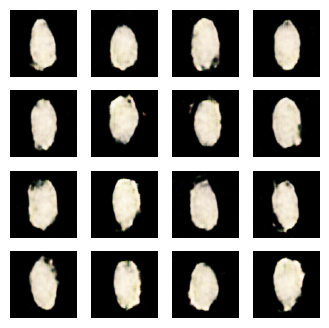

Epoch 71, Gen Loss: 0.6989277601242065, Disc Loss: 1.3843140602111816, Time: 3.46 sec
Epoch 72, Gen Loss: 0.7016564607620239, Disc Loss: 1.381966233253479, Time: 3.43 sec
Epoch 73, Gen Loss: 0.7077035307884216, Disc Loss: 1.3851195573806763, Time: 3.42 sec
Epoch 74, Gen Loss: 0.6992717981338501, Disc Loss: 1.3753858804702759, Time: 3.42 sec
Epoch 75, Gen Loss: 0.7140116691589355, Disc Loss: 1.378056526184082, Time: 3.44 sec
Epoch 76, Gen Loss: 0.7122390270233154, Disc Loss: 1.370839238166809, Time: 3.43 sec
Epoch 77, Gen Loss: 0.7101318836212158, Disc Loss: 1.3748563528060913, Time: 3.44 sec
Epoch 78, Gen Loss: 0.7042304873466492, Disc Loss: 1.3777072429656982, Time: 3.43 sec
Epoch 79, Gen Loss: 0.7127113938331604, Disc Loss: 1.3803871870040894, Time: 3.42 sec
Epoch 80, Gen Loss: 0.7079960107803345, Disc Loss: 1.3755555152893066, Time: 3.44 sec


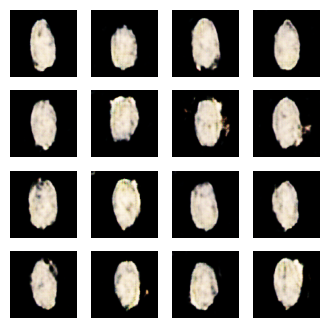

Epoch 81, Gen Loss: 0.7090080976486206, Disc Loss: 1.3698817491531372, Time: 3.44 sec
Epoch 82, Gen Loss: 0.7181515693664551, Disc Loss: 1.3731697797775269, Time: 3.43 sec
Epoch 83, Gen Loss: 0.7086460590362549, Disc Loss: 1.3726415634155273, Time: 3.42 sec
Epoch 84, Gen Loss: 0.7095029950141907, Disc Loss: 1.3736865520477295, Time: 3.43 sec
Epoch 85, Gen Loss: 0.7114060521125793, Disc Loss: 1.3719732761383057, Time: 3.45 sec
Epoch 86, Gen Loss: 0.7095184326171875, Disc Loss: 1.3802539110183716, Time: 3.44 sec
Epoch 87, Gen Loss: 0.7081844806671143, Disc Loss: 1.372833251953125, Time: 3.43 sec
Epoch 88, Gen Loss: 0.7103267908096313, Disc Loss: 1.3785851001739502, Time: 3.44 sec
Epoch 89, Gen Loss: 0.7140413522720337, Disc Loss: 1.3774950504302979, Time: 3.43 sec
Epoch 90, Gen Loss: 0.7058514952659607, Disc Loss: 1.376948356628418, Time: 3.42 sec


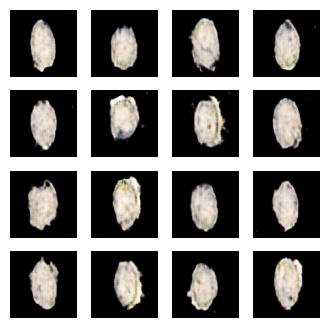

Epoch 91, Gen Loss: 0.7141396403312683, Disc Loss: 1.3766933679580688, Time: 3.42 sec
Epoch 92, Gen Loss: 0.705570638179779, Disc Loss: 1.3756647109985352, Time: 3.43 sec
Epoch 93, Gen Loss: 0.7132678627967834, Disc Loss: 1.3723186254501343, Time: 3.42 sec
Epoch 94, Gen Loss: 0.7101474404335022, Disc Loss: 1.3740501403808594, Time: 3.43 sec
Epoch 95, Gen Loss: 0.7071954011917114, Disc Loss: 1.3785463571548462, Time: 3.42 sec
Epoch 96, Gen Loss: 0.7060078382492065, Disc Loss: 1.3772701025009155, Time: 3.43 sec
Epoch 97, Gen Loss: 0.710089921951294, Disc Loss: 1.3752548694610596, Time: 3.42 sec
Epoch 98, Gen Loss: 0.7119552493095398, Disc Loss: 1.3675249814987183, Time: 3.43 sec
Epoch 99, Gen Loss: 0.7207834720611572, Disc Loss: 1.3643585443496704, Time: 3.43 sec
Epoch 100, Gen Loss: 0.8373095989227295, Disc Loss: 1.3230359554290771, Time: 3.42 sec


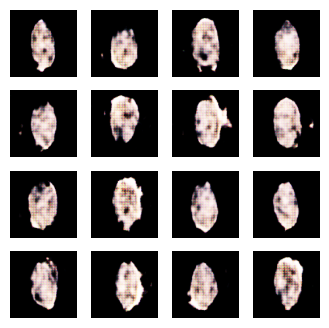

Epoch 101, Gen Loss: 1.9029169082641602, Disc Loss: 0.9746423363685608, Time: 3.42 sec
Epoch 102, Gen Loss: 0.7583454847335815, Disc Loss: 1.342916488647461, Time: 3.42 sec
Epoch 103, Gen Loss: 0.7073259949684143, Disc Loss: 1.3836984634399414, Time: 3.43 sec
Epoch 104, Gen Loss: 0.6747227907180786, Disc Loss: 1.4264264106750488, Time: 3.42 sec
Epoch 105, Gen Loss: 0.6842880249023438, Disc Loss: 1.4018968343734741, Time: 3.42 sec
Epoch 106, Gen Loss: 0.6974251866340637, Disc Loss: 1.383934736251831, Time: 3.46 sec
Epoch 107, Gen Loss: 0.7009596824645996, Disc Loss: 1.368277668952942, Time: 3.42 sec
Epoch 108, Gen Loss: 0.698218584060669, Disc Loss: 1.380109429359436, Time: 3.44 sec
Epoch 109, Gen Loss: 0.7110936045646667, Disc Loss: 1.3756437301635742, Time: 3.42 sec
Epoch 110, Gen Loss: 0.707028865814209, Disc Loss: 1.3736811876296997, Time: 3.43 sec


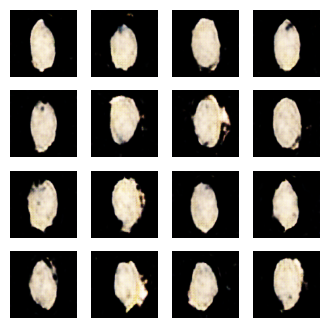

Epoch 111, Gen Loss: 0.7146358489990234, Disc Loss: 1.3695842027664185, Time: 3.42 sec
Epoch 112, Gen Loss: 0.7062238454818726, Disc Loss: 1.3755881786346436, Time: 3.42 sec
Epoch 113, Gen Loss: 0.7148070335388184, Disc Loss: 1.3758764266967773, Time: 3.44 sec
Epoch 114, Gen Loss: 0.704562783241272, Disc Loss: 1.3768255710601807, Time: 3.43 sec
Epoch 115, Gen Loss: 0.7114545702934265, Disc Loss: 1.3766977787017822, Time: 3.42 sec
Epoch 116, Gen Loss: 0.7112970352172852, Disc Loss: 1.3745838403701782, Time: 3.43 sec
Epoch 117, Gen Loss: 0.6991758942604065, Disc Loss: 1.3796437978744507, Time: 3.42 sec
Epoch 118, Gen Loss: 0.7126761078834534, Disc Loss: 1.3705464601516724, Time: 3.43 sec
Epoch 119, Gen Loss: 0.6999358534812927, Disc Loss: 1.3814401626586914, Time: 3.43 sec
Epoch 120, Gen Loss: 0.7090017795562744, Disc Loss: 1.3778431415557861, Time: 3.43 sec


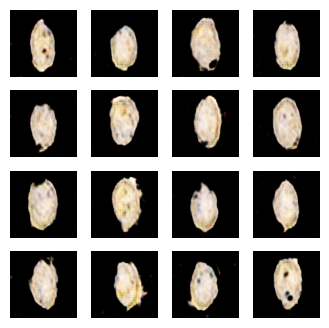

Epoch 121, Gen Loss: 0.7104531526565552, Disc Loss: 1.3794344663619995, Time: 3.43 sec
Epoch 122, Gen Loss: 0.7018545269966125, Disc Loss: 1.3807469606399536, Time: 3.43 sec
Epoch 123, Gen Loss: 0.7011075019836426, Disc Loss: 1.3853652477264404, Time: 3.42 sec
Epoch 124, Gen Loss: 0.7025378942489624, Disc Loss: 1.3840508460998535, Time: 3.42 sec
Epoch 125, Gen Loss: 0.6992112398147583, Disc Loss: 1.384135127067566, Time: 3.42 sec
Epoch 126, Gen Loss: 0.7072830200195312, Disc Loss: 1.3818035125732422, Time: 3.42 sec
Epoch 127, Gen Loss: 0.703842043876648, Disc Loss: 1.3763110637664795, Time: 3.43 sec
Epoch 128, Gen Loss: 0.7045491933822632, Disc Loss: 1.3849260807037354, Time: 3.42 sec
Epoch 129, Gen Loss: 0.6982534527778625, Disc Loss: 1.3878233432769775, Time: 3.42 sec
Epoch 130, Gen Loss: 0.7020485401153564, Disc Loss: 1.382338523864746, Time: 3.42 sec


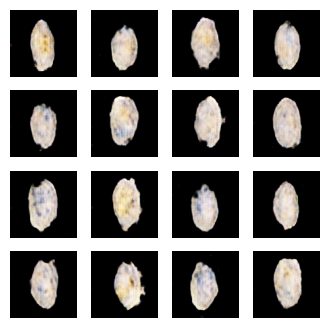

Epoch 131, Gen Loss: 0.7049938440322876, Disc Loss: 1.382755160331726, Time: 3.43 sec
Epoch 132, Gen Loss: 0.6970270276069641, Disc Loss: 1.3886734247207642, Time: 3.42 sec
Epoch 133, Gen Loss: 0.7080278992652893, Disc Loss: 1.3808084726333618, Time: 3.42 sec
Epoch 134, Gen Loss: 0.7002648711204529, Disc Loss: 1.3903475999832153, Time: 3.43 sec
Epoch 135, Gen Loss: 0.7034358978271484, Disc Loss: 1.381040096282959, Time: 3.42 sec
Epoch 136, Gen Loss: 0.6982366442680359, Disc Loss: 1.3864805698394775, Time: 3.42 sec
Epoch 137, Gen Loss: 0.7035163044929504, Disc Loss: 1.382256269454956, Time: 3.42 sec
Epoch 138, Gen Loss: 0.7001096606254578, Disc Loss: 1.3823187351226807, Time: 3.44 sec
Epoch 139, Gen Loss: 0.7025962471961975, Disc Loss: 1.3845739364624023, Time: 3.43 sec
Epoch 140, Gen Loss: 0.7002864480018616, Disc Loss: 1.3892881870269775, Time: 3.42 sec


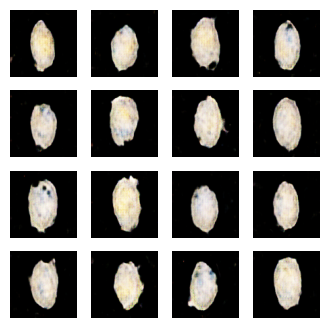

Epoch 141, Gen Loss: 0.6982044577598572, Disc Loss: 1.3867943286895752, Time: 3.43 sec
Epoch 142, Gen Loss: 0.7043828368186951, Disc Loss: 1.3842618465423584, Time: 3.43 sec
Epoch 143, Gen Loss: 0.6979653239250183, Disc Loss: 1.3855022192001343, Time: 3.42 sec
Epoch 144, Gen Loss: 0.70278400182724, Disc Loss: 1.381120204925537, Time: 3.42 sec
Epoch 145, Gen Loss: 0.6948068141937256, Disc Loss: 1.3895862102508545, Time: 3.43 sec
Epoch 146, Gen Loss: 0.6985831260681152, Disc Loss: 1.3867939710617065, Time: 3.43 sec
Epoch 147, Gen Loss: 0.7052060961723328, Disc Loss: 1.3874614238739014, Time: 3.42 sec
Epoch 148, Gen Loss: 0.6938915848731995, Disc Loss: 1.3841891288757324, Time: 3.42 sec
Epoch 149, Gen Loss: 0.7078573703765869, Disc Loss: 1.38675856590271, Time: 3.43 sec
Epoch 150, Gen Loss: 0.6966786980628967, Disc Loss: 1.3822736740112305, Time: 3.42 sec


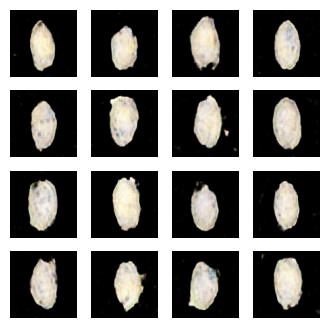

Epoch 151, Gen Loss: 0.7012463212013245, Disc Loss: 1.387587547302246, Time: 3.42 sec
Epoch 152, Gen Loss: 0.7016845345497131, Disc Loss: 1.3822983503341675, Time: 3.43 sec
Epoch 153, Gen Loss: 0.69781893491745, Disc Loss: 1.387097716331482, Time: 3.43 sec
Epoch 154, Gen Loss: 0.6988953948020935, Disc Loss: 1.3884941339492798, Time: 3.42 sec
Epoch 155, Gen Loss: 0.7028975486755371, Disc Loss: 1.387742519378662, Time: 3.42 sec
Epoch 156, Gen Loss: 0.6945701241493225, Disc Loss: 1.3937515020370483, Time: 3.42 sec
Epoch 157, Gen Loss: 0.6945885419845581, Disc Loss: 1.3870428800582886, Time: 3.42 sec
Epoch 158, Gen Loss: 0.6996405720710754, Disc Loss: 1.3852310180664062, Time: 3.41 sec
Epoch 159, Gen Loss: 0.7002127766609192, Disc Loss: 1.3856821060180664, Time: 3.43 sec
Epoch 160, Gen Loss: 0.6987136006355286, Disc Loss: 1.3882699012756348, Time: 3.43 sec


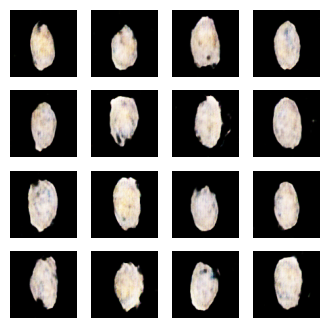

Epoch 161, Gen Loss: 0.6966924071311951, Disc Loss: 1.386191725730896, Time: 3.42 sec
Epoch 162, Gen Loss: 0.7029203176498413, Disc Loss: 1.3886003494262695, Time: 3.41 sec
Epoch 163, Gen Loss: 0.6950543522834778, Disc Loss: 1.38447904586792, Time: 3.42 sec
Epoch 164, Gen Loss: 0.7026079297065735, Disc Loss: 1.389509677886963, Time: 3.42 sec
Epoch 165, Gen Loss: 0.6945527195930481, Disc Loss: 1.3911266326904297, Time: 3.41 sec
Epoch 166, Gen Loss: 0.6968647837638855, Disc Loss: 1.3898249864578247, Time: 3.42 sec
Epoch 167, Gen Loss: 0.7010819315910339, Disc Loss: 1.385504961013794, Time: 3.43 sec
Epoch 168, Gen Loss: 0.6985938549041748, Disc Loss: 1.3854689598083496, Time: 3.41 sec
Epoch 169, Gen Loss: 0.6958256363868713, Disc Loss: 1.3844023942947388, Time: 3.42 sec
Epoch 170, Gen Loss: 0.7049381732940674, Disc Loss: 1.3830024003982544, Time: 3.43 sec


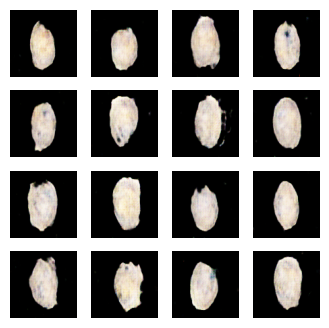

Epoch 171, Gen Loss: 0.6946226954460144, Disc Loss: 1.3859142065048218, Time: 3.43 sec
Epoch 172, Gen Loss: 0.7014333605766296, Disc Loss: 1.3818796873092651, Time: 3.42 sec
Epoch 173, Gen Loss: 0.6960541009902954, Disc Loss: 1.3867270946502686, Time: 3.42 sec
Epoch 174, Gen Loss: 0.6999120712280273, Disc Loss: 1.3868255615234375, Time: 3.42 sec
Epoch 175, Gen Loss: 0.7017108798027039, Disc Loss: 1.3862131834030151, Time: 3.42 sec
Epoch 176, Gen Loss: 0.6953275203704834, Disc Loss: 1.3850300312042236, Time: 3.42 sec
Epoch 177, Gen Loss: 0.700978696346283, Disc Loss: 1.3830119371414185, Time: 3.43 sec
Epoch 178, Gen Loss: 0.6975877285003662, Disc Loss: 1.38802170753479, Time: 3.42 sec
Epoch 179, Gen Loss: 0.6985194087028503, Disc Loss: 1.3853744268417358, Time: 3.42 sec
Epoch 180, Gen Loss: 0.70058274269104, Disc Loss: 1.383778691291809, Time: 3.43 sec


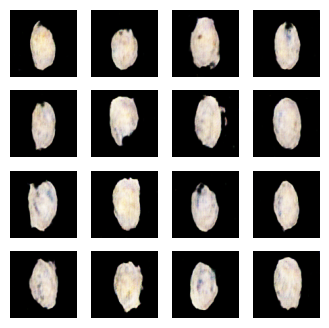

Epoch 181, Gen Loss: 0.6982558965682983, Disc Loss: 1.3847894668579102, Time: 3.43 sec
Epoch 182, Gen Loss: 0.7039241790771484, Disc Loss: 1.383985996246338, Time: 3.42 sec
Epoch 183, Gen Loss: 0.6972681879997253, Disc Loss: 1.3829220533370972, Time: 3.42 sec
Epoch 184, Gen Loss: 0.7005074620246887, Disc Loss: 1.3826379776000977, Time: 3.43 sec
Epoch 185, Gen Loss: 0.6998417973518372, Disc Loss: 1.3868509531021118, Time: 3.42 sec
Epoch 186, Gen Loss: 0.6932405233383179, Disc Loss: 1.385446310043335, Time: 3.42 sec
Epoch 187, Gen Loss: 0.7033184170722961, Disc Loss: 1.382454752922058, Time: 3.42 sec
Epoch 188, Gen Loss: 0.6984957456588745, Disc Loss: 1.3867772817611694, Time: 3.42 sec
Epoch 189, Gen Loss: 0.6990785598754883, Disc Loss: 1.38296639919281, Time: 3.41 sec
Epoch 190, Gen Loss: 0.698361873626709, Disc Loss: 1.3862746953964233, Time: 3.43 sec


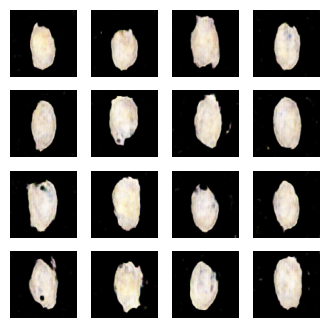

Epoch 191, Gen Loss: 0.6995761394500732, Disc Loss: 1.381029725074768, Time: 3.43 sec
Epoch 192, Gen Loss: 0.7003940343856812, Disc Loss: 1.383803367614746, Time: 3.42 sec
Epoch 193, Gen Loss: 0.7016717195510864, Disc Loss: 1.383771300315857, Time: 3.42 sec
Epoch 194, Gen Loss: 0.6994722485542297, Disc Loss: 1.3827905654907227, Time: 3.42 sec
Epoch 195, Gen Loss: 0.6989920735359192, Disc Loss: 1.3812769651412964, Time: 3.42 sec
Epoch 196, Gen Loss: 0.6978315114974976, Disc Loss: 1.385250210762024, Time: 3.41 sec
Epoch 197, Gen Loss: 0.6994038820266724, Disc Loss: 1.3852651119232178, Time: 3.41 sec
Epoch 198, Gen Loss: 0.6989831924438477, Disc Loss: 1.3821547031402588, Time: 3.42 sec
Epoch 199, Gen Loss: 0.7020084857940674, Disc Loss: 1.3812272548675537, Time: 3.42 sec
Epoch 200, Gen Loss: 0.6993446946144104, Disc Loss: 1.3848893642425537, Time: 3.42 sec


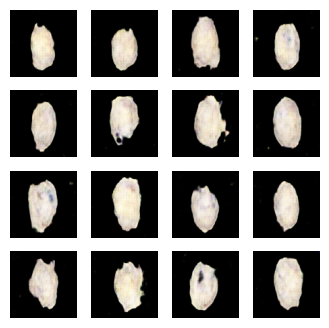

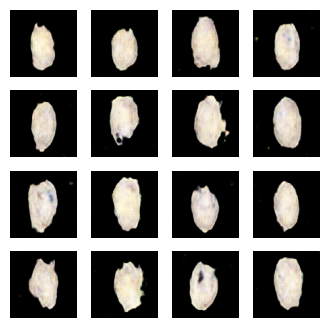

In [152]:
# Mulai Training
EPOCHS = 200 # Training GAN butuh banyak epoch, pake 200 epoch
history = train(train_dataset, EPOCHS)

menjalankan proses training Modified GAN selama 200 epoch

model Modified GAN telah berhasil menghasilkan gambar biji kirmizi yang mirip secara bentuk global dengan data asli. Bentuk oval dan orientasi biji sudah ditiru dengan cukup konsisten.

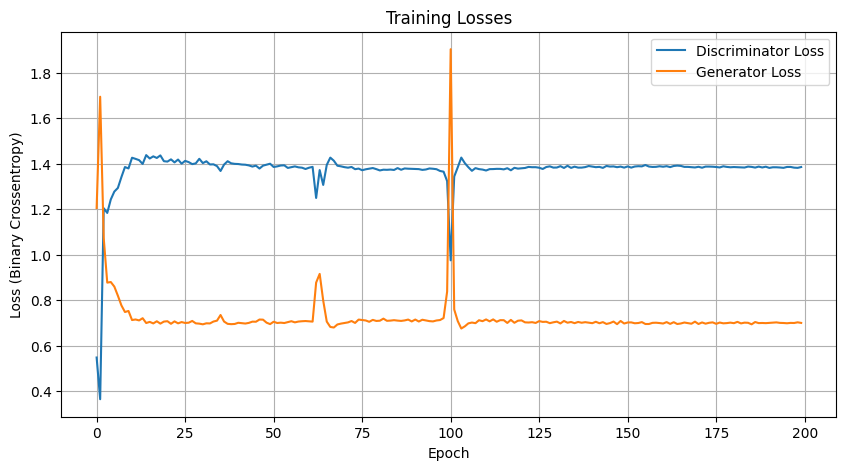

In [153]:
# Plot training progress
plt.figure(figsize=(10, 5))
plt.plot(history['disc_loss'], label='Discriminator Loss')
plt.plot(history['gen_loss'], label='Generator Loss')
plt.title("Training Losses")
plt.xlabel('Epoch')
plt.ylabel('Loss (Binary Crossentropy)')
plt.legend()
plt.grid(True)
plt.show()

Pada awal training, terjadi fluktuasi besar pada kedua loss, yang merupakan hal wajar saat model masih belajar menyesuaikan diri. Setelah sekitar 10 – 15 epoch, loss mulai stabil. Discriminator loss menetap di sekitar 1.35, sedangkan generator loss turun dan konsisten di kisaran 0.7.

Lalu terlihat ada lonjakan tajam di sekitar epoch ke-100, di mana kedua loss meningkat drastis. Ini kemungkinan besar akibat instabilitas sementara dalam pelatihan, seperti update parameter yang ekstrem atau perubahan mendadak pada kualitas output generator. Namun, setelah itu, model kembali stabil dan melanjutkan pelatihan dengan pola loss yang relatif konstan.

Secara keseluruhan, loss yang stabil di akhir pelatihan menunjukkan bahwa model telah mencapai keseimbangan yang cukup baik antara generator dan discriminator,

# C

## FID EVALUATION

In [155]:
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.models import Model
from scipy.linalg import sqrtm


In [156]:
def get_inception_model():
    base_model = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))
    return Model(inputs=base_model.input, outputs=base_model.output)

def calculate_fid(real_images, generated_images):
    # Resize ke 299x299
    real_images = tf.image.resize(real_images, (299, 299)).numpy()
    generated_images = tf.image.resize(generated_images, (299, 299)).numpy()

    # Preprocess Inception
    real_images = preprocess_input(real_images)
    generated_images = preprocess_input(generated_images)

    # Ekstraksi fitur dari Inception
    model = get_inception_model()
    act1 = model.predict(real_images, verbose=0)
    act2 = model.predict(generated_images, verbose=0)

    # Rata-rata dan kovarians
    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)

    # Hitung sqrt dari produk kovarians
    diff = mu1 - mu2
    covmean, _ = sqrtm(sigma1 @ sigma2, disp=False)

    if np.iscomplexobj(covmean):
        covmean = covmean.real

    fid = diff @ diff + np.trace(sigma1 + sigma2 - 2 * covmean)
    return fid


membuat Fungsi get_inception_model dan calculate_fid untuk mengevaluasi kualitas gambar hasil generator menggunakan metrik Fréchet Inception Distance (FID). Model InceptionV3 digunakan untuk mengekstrak fitur dari gambar asli dan gambar hasil generator, lalu FID dihitung berdasarkan perbedaan rata-rata dan kovariansi dari fitur tersebut, jadi semakin rendah nilai FID, semakin mirip distribusi gambar hasil generator terhadap gambar asli.

In [157]:
# Ambil 100 sampel real dari dataset
real_sample = dataset[:100]
real_sample = (real_sample + 1.0) / 2.0  # Denormalisasi ke [0,1]

# Siapkan noise
noise = tf.random.normal((100, LATENT_DIM))

# Hasilkan gambar dari model baseline
fake_baseline = build_generator()(noise, training=False)
fake_baseline = (fake_baseline + 1.0) / 2.0  # Denormalisasi

# Hasilkan gambar dari model modifikasi
fake_modified = build_modified_generator()(noise, training=False)
fake_modified = (fake_modified + 1.0) / 2.0  # Denormalisasi

# Hitung FID
fid_baseline = calculate_fid(real_sample, fake_baseline)
fid_modified = calculate_fid(real_sample, fake_modified)

print(f"FID Model Baseline   : {fid_baseline:.2f}")
print(f"FID Model Modifikasi : {fid_modified:.2f}")


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
FID Model Baseline   : 10.69
FID Model Modifikasi : 10.66


membandingkan kualitas gambar yang dihasilkan oleh dua model generator, baseline dan modifikasi dengan menghitung nilai Fréchet Inception Distance (FID) terhadap 100 sampel  

Hasil evaluasi menunjukkan bahwa model modifikasi memiliki FID sedikit lebih rendah (10.66) dibandingkan model baseline (10.69), yang berarti gambar dari model modifikasi sedikit lebih mirip dengan data asli dan secara kualitas dianggap lebih baik.

Kedua model menghasilkan nilai FID di sekitar 10, yang berarti hasil gambar sangat mendekati data asli dan sudah termasuk dalam kategori kualitas sangat baik.

# D

link video penjelasan nomor 3 :

https://drive.google.com/file/d/1yxKwjDk291MviTWkcTlFkGKIYjRg_3cQ/view?usp=sharing